#  IMPORT LIBRARIES AND DATASETS

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import zipfile
import cv2
from skimage import io
import tensorflow as tf
from tensorflow.python.keras import Sequential
from tensorflow.keras import layers, optimizers
from tensorflow.keras.applications import DenseNet121
from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.initializers import glorot_uniform
from tensorflow.keras.utils import plot_model
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint, LearningRateScheduler
from IPython.display import display
from tensorflow.keras import backend as K
from sklearn.preprocessing import StandardScaler, normalize
import os
import glob
import random
%matplotlib inline

In [2]:
%cd /Users/chaithra/tensorflow-test/Brain_MRI

/Users/chaithra/tensorflow-test/Brain_MRI


In [3]:
# data containing path to Brain MRI and their corresponding mask
brain_df = pd.read_csv('data_mask.csv')

In [4]:
brain_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3929 entries, 0 to 3928
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   patient_id  3929 non-null   object
 1   image_path  3929 non-null   object
 2   mask_path   3929 non-null   object
 3   mask        3929 non-null   int64 
dtypes: int64(1), object(3)
memory usage: 122.9+ KB


In [5]:
brain_df.head()

,patient_id,image_path,mask_path,mask
0,TCGA_CS_5395_19981004,TCGA_CS_5395_19981004/TCGA_CS_5395_19981004_1.tif,TCGA_CS_5395_19981004/TCGA_CS_5395_19981004_1_...,0
1,TCGA_CS_5395_19981004,TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_1.tif,TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_1_...,0
2,TCGA_CS_5395_19981004,TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_1.tif,TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_1_...,0
3,TCGA_CS_5395_19981004,TCGA_CS_4943_20000902/TCGA_CS_4943_20000902_1.tif,TCGA_CS_4943_20000902/TCGA_CS_4943_20000902_1_...,0
4,TCGA_CS_5395_19981004,TCGA_CS_5396_20010302/TCGA_CS_5396_20010302_1.tif,TCGA_CS_5396_20010302/TCGA_CS_5396_20010302_1_...,0


In [6]:
brain_df.mask_path[1] # Path to the brain MRI image

'TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_1_mask.tif'

In [7]:
brain_df.image_path[1] # Path to the segmentation mask

'TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_1.tif'

# PERFORM DATA VISUALIZATION

In [8]:
brain_df[:5]

,patient_id,image_path,mask_path,mask
0,TCGA_CS_5395_19981004,TCGA_CS_5395_19981004/TCGA_CS_5395_19981004_1.tif,TCGA_CS_5395_19981004/TCGA_CS_5395_19981004_1_...,0
1,TCGA_CS_5395_19981004,TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_1.tif,TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_1_...,0
2,TCGA_CS_5395_19981004,TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_1.tif,TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_1_...,0
3,TCGA_CS_5395_19981004,TCGA_CS_4943_20000902/TCGA_CS_4943_20000902_1.tif,TCGA_CS_4943_20000902/TCGA_CS_4943_20000902_1_...,0
4,TCGA_CS_5395_19981004,TCGA_CS_5396_20010302/TCGA_CS_5396_20010302_1.tif,TCGA_CS_5396_20010302/TCGA_CS_5396_20010302_1_...,0


In [9]:
brain_df['mask'].value_counts().index

Index([0, 1], dtype='int64', name='mask')

In [10]:
# Use plotly to plot interactive bar chart
import plotly.graph_objects as go

fig = go.Figure([go.Bar(x = brain_df['mask'].value_counts().index, y = brain_df['mask'].value_counts())])
fig.update_traces(marker_color = 'rgb(0,200,0)', marker_line_color = 'rgb(0,0,0)',
                  marker_line_width = 2, opacity = 0.6)
fig.show()

In [11]:
# Obtain the percentage of images with mask
round((brain_df['mask'].value_counts()* 100 / len(brain_df['mask'])),2)

mask
0    65.05
1    34.95
Name: count, dtype: float64

In [12]:
brain_df.mask_path[:5]

0    TCGA_CS_5395_19981004/TCGA_CS_5395_19981004_1_...
1    TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_1_...
2    TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_1_...
3    TCGA_CS_4943_20000902/TCGA_CS_4943_20000902_1_...
4    TCGA_CS_5396_20010302/TCGA_CS_5396_20010302_1_...
Name: mask_path, dtype: object

In [13]:
brain_df.image_path[:5]

0    TCGA_CS_5395_19981004/TCGA_CS_5395_19981004_1.tif
1    TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_1.tif
2    TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_1.tif
3    TCGA_CS_4943_20000902/TCGA_CS_4943_20000902_1.tif
4    TCGA_CS_5396_20010302/TCGA_CS_5396_20010302_1.tif
Name: image_path, dtype: object

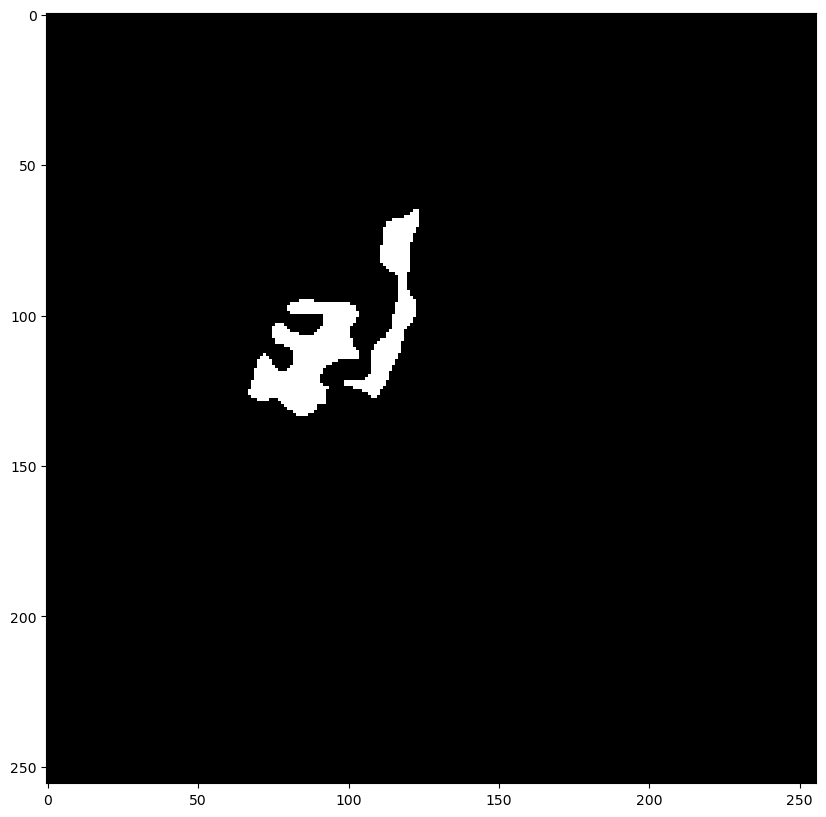

In [16]:
plt.figure(figsize=(10,10))
plt.imshow(cv2.imread(brain_df.mask_path[2490]))
plt.show()

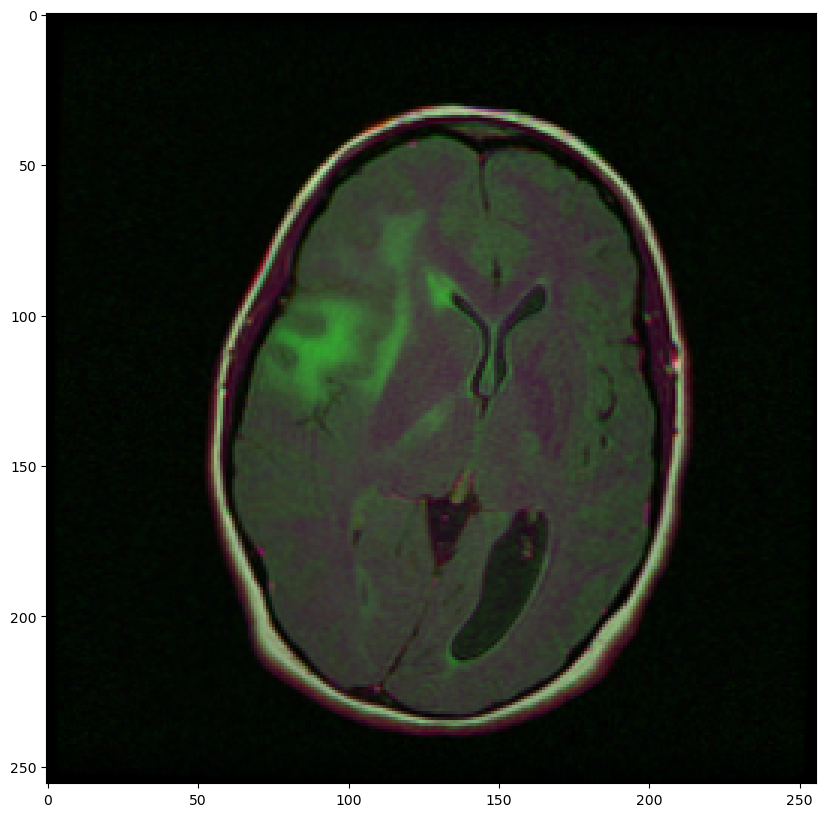

In [17]:
plt.figure(figsize=(10,10))
plt.imshow(cv2.imread(brain_df.image_path[2490]))
plt.show()

In [18]:
cv2.imread(brain_df.mask_path[2490]).max()

255

In [19]:
cv2.imread(brain_df.mask_path[2490]).min()

0

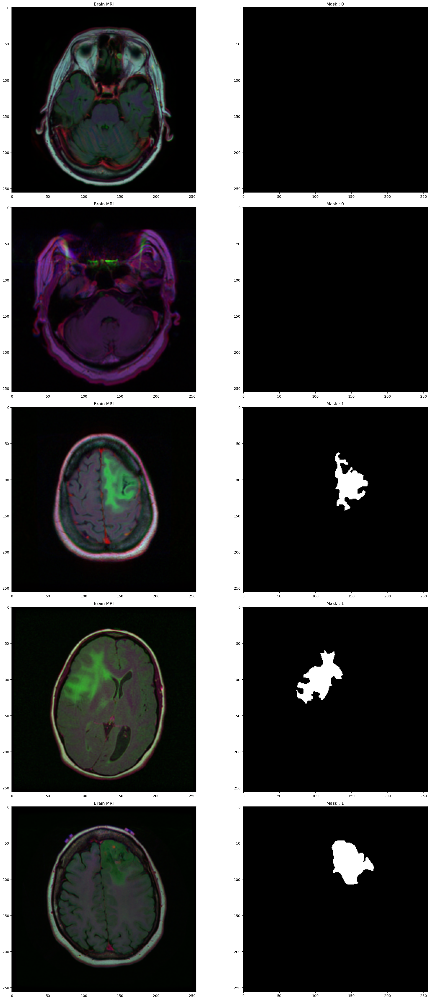

In [20]:
# Basic visualizations: Visualize the images (MRI and Mask) in the dataset separately 
import random
fig, axs = plt.subplots(5,2, figsize=(20,40))
count = 0
for x in range(5):
  i = random.randint(0, len(brain_df)) # select a random index 
  axs[count][0].title.set_text("Brain MRI") # set title
  axs[count][0].imshow(cv2.imread(brain_df.image_path[i])) # show MRI 
  axs[count][1].title.set_text("Mask : " + str(brain_df['mask'][i])) # plot title on the mask (0 or 1)
  axs[count][1].imshow(cv2.imread(brain_df.mask_path[i])) # Show corresponding mask
  count += 1

fig.tight_layout()

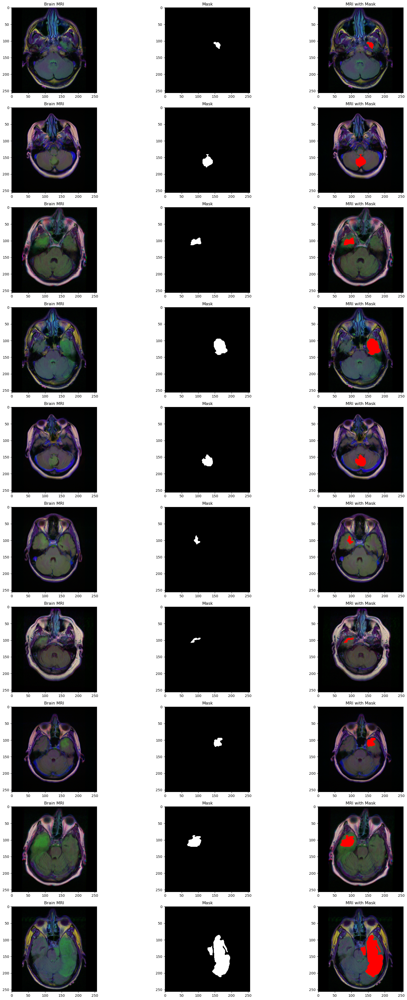

In [21]:
# Advanced Visualization: visualize the MRI scans along with their mask on one image 
count = 0
fig, axs = plt.subplots(10, 3, figsize = (20, 40))
for i in range(len(brain_df)):
  if brain_df['mask'][i] ==1 and count <10:
    img = io.imread(brain_df.image_path[i])
    axs[count][0].title.set_text('Brain MRI')
    axs[count][0].imshow(img)

    mask = io.imread(brain_df.mask_path[i])
    axs[count][1].title.set_text('Mask')
    axs[count][1].imshow(mask, cmap = 'gray')

    
    img[mask == 255] = (255, 0, 0)
    axs[count][2].title.set_text('MRI with Mask')
    axs[count][2].imshow(img)
    count+=1

fig.tight_layout()


# TRAIN A CLASSIFIER MODEL TO DETECT IF TUMOR EXISTS OR NOT

In [22]:
# Drop the patient id column
brain_df_train = brain_df.drop(columns = ['patient_id'])
brain_df_train.shape

(3929, 3)

In [23]:
# Convert the data in mask column to string format, to use categorical mode in flow_from_dataframe
brain_df_train['mask'] = brain_df_train['mask'].apply(lambda x: str(x))

In [24]:
brain_df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3929 entries, 0 to 3928
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image_path  3929 non-null   object
 1   mask_path   3929 non-null   object
 2   mask        3929 non-null   object
dtypes: object(3)
memory usage: 92.2+ KB


In [25]:
# split the data into train and test data

from sklearn.model_selection import train_test_split

train, test = train_test_split(brain_df_train, test_size = 0.2,random_state=42)

In [49]:
# create a image generator
from keras_preprocessing.image import ImageDataGenerator

# Create a data generator which scales the data from 0 to 1 and makes validation split of 0.1
datagen = ImageDataGenerator(rescale=1./255., validation_split = 0.1)


In [50]:
train_generator=datagen.flow_from_dataframe(
dataframe=train,
directory= './',
x_col='image_path',
y_col='mask',
subset="training",
batch_size=16,
shuffle=True,
class_mode="categorical",
target_size=(256,256))


valid_generator=datagen.flow_from_dataframe(
dataframe=train,
directory= './',
x_col='image_path',
y_col='mask',
subset="validation",
batch_size=16,
shuffle=True,
class_mode="categorical",
target_size=(256,256))

# Create a data generator for test images
test_datagen=ImageDataGenerator(rescale=1./255.)

test_generator=test_datagen.flow_from_dataframe(
dataframe=test,
directory= './',
x_col='image_path',
y_col='mask',
batch_size=16,
shuffle=False,
class_mode='categorical',
target_size=(256,256))



Found 2829 validated image filenames belonging to 2 classes.
Found 314 validated image filenames belonging to 2 classes.
Found 786 validated image filenames belonging to 2 classes.


In [51]:
# Get the ResNet50 base model
basemodel = ResNet50(weights = 'imagenet', include_top = False, input_tensor = Input(shape=(256, 256, 3)))

In [52]:
basemodel.summary()

Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 262, 262, 3)          0         ['input_2[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 128, 128, 64)         9472      ['conv1_pad[0][0]']           
                                                                                                  
 conv1_bn (BatchNormalizati  (None, 128, 128, 64)         256       ['conv1_conv[0][0]']          
 on)                                                                                       

In [53]:
# freeze the model weights

for layer in basemodel.layers:
  layers.trainable = False

In [54]:
# Add classification head to the base model

headmodel = basemodel.output
headmodel = AveragePooling2D(pool_size = (4,4))(headmodel)
headmodel = Flatten(name= 'flatten')(headmodel)
headmodel = Dense(256, activation = "relu")(headmodel)
headmodel = Dropout(0.25)(headmodel)#
headmodel = Dense(256, activation = "relu")(headmodel)
headmodel = Dropout(0.25)(headmodel)
headmodel = Dense(256, activation = "relu")(headmodel)
headmodel = Dropout(0.25)(headmodel)
headmodel = Dense(2, activation = 'softmax')(headmodel)

model = Model(inputs = basemodel.input, outputs = headmodel)

In [55]:
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 262, 262, 3)          0         ['input_2[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 128, 128, 64)         9472      ['conv1_pad[0][0]']           
                                                                                                  
 conv1_bn (BatchNormalizati  (None, 128, 128, 64)         256       ['conv1_conv[0][0]']          
 on)                                                                                        

In [59]:
earlystopping = EarlyStopping(monitor='val_loss', 
                              mode='min', 
                              verbose=1, 
                              patience=25
                             )
checkpointer = ModelCheckpoint(filepath="classifier-resnet-weights.hdf5", 
                               verbose=1, 
                               save_best_only=True
                              )
reduce_lr = ReduceLROnPlateau(monitor='val_loss',
                              mode='min',
                              verbose=1,
                              patience=10,
                              min_delta=0.0001,
                              factor=0.2
                             )
callbacks = [checkpointer, earlystopping, reduce_lr]

In [60]:
# compile the model

model.compile(loss = 'categorical_crossentropy', optimizer='adam', metrics= ["accuracy"])

In [61]:
history = model.fit(train_generator, 
              steps_per_epoch= train_generator.n // train_generator.batch_size, 
              epochs = 100, 
              validation_data= valid_generator, 
              validation_steps= valid_generator.n // valid_generator.batch_size, 
              callbacks = [checkpointer, earlystopping, reduce_lr])

Epoch 1/100
176/176 [==============================] - ETA: 0s - loss: 3.2923 - accuracy: 0.6669
Epoch 1: val_loss improved from inf to 1367.66052, saving model to classifier-resnet-weights.hdf5


/Users/chaithra/tensorflow-test/env/lib/python3.8/site-packages/keras/src/engine/training.py:3000: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.



176/176 [==============================] - 55s 298ms/step - loss: 3.2923 - accuracy: 0.6669 - val_loss: 1367.6605 - val_accuracy: 0.6513 - lr: 0.0010
Epoch 2/100
176/176 [==============================] - ETA: 0s - loss: 6.8766 - accuracy: 0.6680
Epoch 2: val_loss improved from 1367.66052 to 0.62291, saving model to classifier-resnet-weights.hdf5
176/176 [==============================] - 52s 295ms/step - loss: 6.8766 - accuracy: 0.6680 - val_loss: 0.6229 - val_accuracy: 0.6579 - lr: 0.0010
Epoch 3/100
176/176 [==============================] - ETA: 0s - loss: 7.1465 - accuracy: 0.6029
Epoch 3: val_loss did not improve from 0.62291
176/176 [==============================] - 51s 291ms/step - loss: 7.1465 - accuracy: 0.6029 - val_loss: 51.4543 - val_accuracy: 0.6513 - lr: 0.0010
Epoch 4/100
176/176 [==============================] - ETA: 0s - loss: 6.2602 - accuracy: 0.6456
Epoch 4: val_loss did not improve from 0.62291
176/176 [==============================] - 51s 289ms/step - loss: 6.

# Save the model architecture to json file for future use


In [62]:
model_json = model.to_json()
with open("classifierresnetmodel.json", "w") as json_file:
    json_file.write(model_json)

# ASSESS TRAINED MODEL PERFORMANCE

In [63]:
with open('classifierresnetmodel.json', 'r') as json_file:
    json_savedModel= json_file.read()
# load the model  
model = tf.keras.models.model_from_json(json_savedModel)
model.load_weights('classifier-resnet-weights.hdf5')
model.compile(loss = 'categorical_crossentropy', optimizer='adam', metrics= ["accuracy"])

In [64]:
# make prediction

test_predict = model.predict(test_generator, steps = test_generator.n // 16, verbose =1)

49/49 [==============================] - 4s 79ms/step


In [65]:
test_predict.shape

(784, 2)

In [66]:
test_predict[:5]

array([[6.7435694e-01, 3.2564306e-01],
       [6.2350297e-01, 3.7649700e-01],
       [7.8895211e-01, 2.1104792e-01],
       [5.8966851e-01, 4.1033152e-01],
       [1.0000000e+00, 1.9091900e-11]], dtype=float32)

In [67]:
# Obtain the predicted class from the model prediction
predict = []

for i in test_predict:
  predict.append(str(np.argmax(i)))

predict = np.asarray(predict)

In [68]:
predict

array(['0', '0', '0', '0', '0', '0', '1', '0', '0', '0', '0', '0', '0',
       '1', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0',
       '0', '0', '1', '0', '1', '0', '0', '0', '0', '0', '0', '0', '0',
       '0', '1', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0',
       '0', '0', '0', '0', '0', '0', '0', '1', '0', '0', '0', '0', '0',
       '0', '0', '0', '1', '0', '0', '0', '0', '0', '0', '0', '0', '0',
       '1', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '1', '0',
       '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0',
       '0', '1', '1', '0', '0', '1', '0', '0', '0', '0', '0', '0', '0',
       '0', '0', '0', '1', '0', '0', '0', '0', '0', '0', '0', '0', '0',
       '0', '0', '0', '0', '1', '0', '0', '0', '0', '0', '0', '0', '0',
       '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0',
       '0', '0', '0', '0', '0', '1', '0', '0', '0', '0', '1', '0', '0',
       '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0

In [69]:
# since we have used test generator, it limited the images to len(predict), due to batch size
original = np.asarray(test['mask'])[:len(predict)]
len(original)

784

In [70]:
# Obtain the accuracy of the model
from sklearn.metrics import accuracy_score

accuracy = round(accuracy_score(original, predict),2)
accuracy

0.63

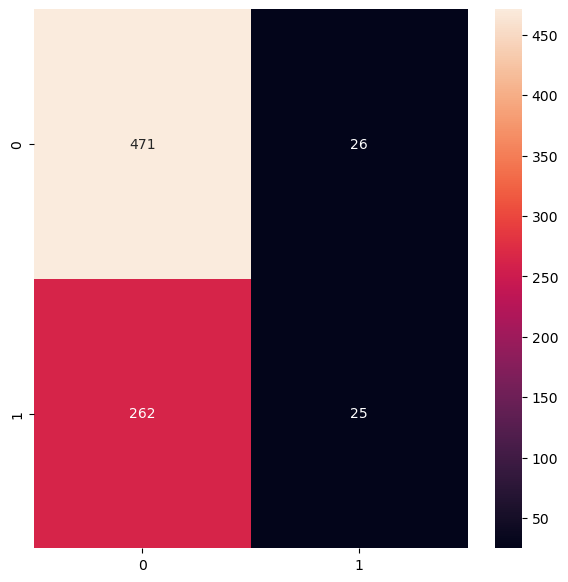

In [71]:
# plot the confusion matrix
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(original, predict)
plt.figure(figsize = (7,7))
sns.heatmap(cm, annot=True,fmt='d')
plt.show()

In [72]:
from sklearn.metrics import classification_report

report = classification_report(original, predict, labels = [0,1])
print(report)

              precision    recall  f1-score   support

           0       0.64      0.95      0.77       497
           1       0.49      0.09      0.15       287

   micro avg       0.63      0.63      0.63       784
   macro avg       0.57      0.52      0.46       784
weighted avg       0.59      0.63      0.54       784



/Users/chaithra/tensorflow-test/env/lib/python3.8/site-packages/numpy/lib/arraysetops.py:608: FutureWarning:

elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison

/Users/chaithra/tensorflow-test/env/lib/python3.8/site-packages/numpy/lib/arraysetops.py:608: FutureWarning:

elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison

/Users/chaithra/tensorflow-test/env/lib/python3.8/site-packages/numpy/lib/arraysetops.py:608: FutureWarning:

elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison

/Users/chaithra/tensorflow-test/env/lib/python3.8/site-packages/numpy/lib/arraysetops.py:608: FutureWarning:

elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison



# BUILD A SEGMENTATION MODEL TO LOCALIZE TUMOR

In [73]:
# Get the dataframe containing MRIs which have masks associated with them.
brain_df_mask = brain_df[brain_df['mask'] == 1]
brain_df_mask.shape

(1373, 4)

In [74]:
# split the data into train and test data

from sklearn.model_selection import train_test_split

X_train, X_val = train_test_split(brain_df_mask, test_size=0.2,random_state=42)
X_test, X_val = train_test_split(X_val, test_size=0.5,random_state=42)

In [75]:
X_train.shape,X_test.shape, X_val.shape

((1098, 4), (137, 4), (138, 4))

In [76]:
# create separate list for imageId, classId to pass into the generator

train_ids = list(X_train.image_path)
train_mask = list(X_train.mask_path)

val_ids = list(X_val.image_path)
val_mask= list(X_val.mask_path)

In [77]:
# Utilities file contains the code for custom loss function and custom data generator
from utilities import DataGenerator

# create image generators

training_generator = DataGenerator(train_ids,train_mask)
validation_generator = DataGenerator(val_ids,val_mask)

In [78]:
def resblock(X, f):
  

  # make a copy of input
  X_copy = X

  # main path
  # Read more about he_normal: https://medium.com/@prateekvishnu/xavier-and-he-normal-he-et-al-initialization-8e3d7a087528

  X = Conv2D(f, kernel_size = (1,1) ,strides = (1,1),kernel_initializer ='he_normal')(X)
  X = BatchNormalization()(X)
  X = Activation('relu')(X) 

  X = Conv2D(f, kernel_size = (3,3), strides =(1,1), padding = 'same', kernel_initializer ='he_normal')(X)
  X = BatchNormalization()(X)

  # Short path
  # Read more here: https://towardsdatascience.com/understanding-and-coding-a-resnet-in-keras-446d7ff84d33

  X_copy = Conv2D(f, kernel_size = (1,1), strides =(1,1), kernel_initializer ='he_normal')(X_copy)
  X_copy = BatchNormalization()(X_copy)

  # Adding the output from main path and short path together

  X = Add()([X,X_copy])
  X = Activation('relu')(X)

  return X

In [79]:
# function to upscale and concatenate the values passsed
def upsample_concat(x, skip):
  x = UpSampling2D((2,2))(x)
  merge = Concatenate()([x, skip])

  return merge

In [80]:
input_shape = (256,256,3)

# Input tensor shape
X_input = Input(input_shape)

# Stage 1
conv1_in = Conv2D(16,3,activation= 'relu', padding = 'same', kernel_initializer ='he_normal')(X_input)
conv1_in = BatchNormalization()(conv1_in)
conv1_in = Conv2D(16,3,activation= 'relu', padding = 'same', kernel_initializer ='he_normal')(conv1_in)
conv1_in = BatchNormalization()(conv1_in)
pool_1 = MaxPool2D(pool_size = (2,2))(conv1_in)

# Stage 2
conv2_in = resblock(pool_1, 32)
pool_2 = MaxPool2D(pool_size = (2,2))(conv2_in)

# Stage 3
conv3_in = resblock(pool_2, 64)
pool_3 = MaxPool2D(pool_size = (2,2))(conv3_in)

# Stage 4
conv4_in = resblock(pool_3, 128)
pool_4 = MaxPool2D(pool_size = (2,2))(conv4_in)

# Stage 5 (Bottle Neck)
conv5_in = resblock(pool_4, 256)

# Upscale stage 1
up_1 = upsample_concat(conv5_in, conv4_in)
up_1 = resblock(up_1, 128)

# Upscale stage 2
up_2 = upsample_concat(up_1, conv3_in)
up_2 = resblock(up_2, 64)

# Upscale stage 3
up_3 = upsample_concat(up_2, conv2_in)
up_3 = resblock(up_3, 32)

# Upscale stage 4
up_4 = upsample_concat(up_3, conv1_in)
up_4 = resblock(up_4, 16)

# Final Output
output = Conv2D(1, (1,1), padding = "same", activation = "sigmoid")(up_4)

model_seg = Model(inputs = X_input, outputs = output )


In [81]:
model_seg.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_3 (InputLayer)        [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 conv2d_27 (Conv2D)          (None, 256, 256, 16)         448       ['input_3[0][0]']             
                                                                                                  
 batch_normalization_26 (Ba  (None, 256, 256, 16)         64        ['conv2d_27[0][0]']           
 tchNormalization)                                                                                
                                                                                                  
 conv2d_28 (Conv2D)          (None, 256, 256, 16)         2320      ['batch_normalization_26

# TRAIN A SEGMENTATION RESUNET MODEL TO LOCALIZE TUMOR

## Loss function:
 
We need a custom loss function to train this ResUNet.So,  we have used the loss function as it is from https://github.com/nabsabraham/focal-tversky-unet/blob/master/losses.py




In [82]:
"""@article{focal-unet,
  title={A novel Focal Tversky loss function with improved Attention U-Net for lesion segmentation},
  author={Abraham, Nabila and Khan, Naimul Mefraz},
  journal={arXiv preprint arXiv:1810.07842},
  year={2018}
}"""

'@article{focal-unet,\n  title={A novel Focal Tversky loss function with improved Attention U-Net for lesion segmentation},\n  author={Abraham, Nabila and Khan, Naimul Mefraz},\n  journal={arXiv preprint arXiv:1810.07842},\n  year={2018}\n}'

In [83]:
# Utilities file contains the code for custom loss function and custom data generator

from utilities import tversky_loss, tversky

In [84]:
def focal_tversky(y_true,y_pred):
    ## IMPORTANT NOTE:
    ## It seems that the type of y_true and y_pred are not the same. One is of type
    ## float32 and other int64. They need to be cast as the same type for the training
    ## to actually work.
    y_true = tf.cast(y_true, tf.float32)
    y_pred = tf.cast(y_pred, tf.float32)
    #print(type(y_pred))
    pt_1 = tversky(y_true, y_pred)
    gamma = 0.75
    return K.pow((1-pt_1), gamma)

In [85]:
# compling model and callbacks functions
adam = tf.keras.optimizers.Adam(lr = 0.05, epsilon = 0.1)
model_seg.compile(optimizer = adam, 
                  loss = focal_tversky, 
                  metrics = [tversky]
                 )
#callbacks
earlystopping = EarlyStopping(monitor='val_loss',
                              mode='min', 
                              verbose=1, 
                              patience=25
                             )
# save the best model with lower validation loss
checkpointer = ModelCheckpoint(filepath="workingResUNet-weights.hdf5", 
                               verbose=1, 
                               save_best_only=True
                              )
reduce_lr = ReduceLROnPlateau(monitor='val_loss',
                              mode='min',
                              verbose=1,
                              patience=10,
                              min_delta=0.0001,
                              factor=0.2
                             )

In [86]:
history = model_seg.fit(training_generator, epochs = 1000, validation_data = validation_generator,
                        callbacks = [checkpointer, earlystopping,reduce_lr])

Epoch 1/1000
68/68 [==============================] - ETA: 0s - loss: 0.9320 - tversky: 0.0896
Epoch 1: val_loss improved from inf to 0.92925, saving model to workingResUNet-weights.hdf5
68/68 [==============================] - 22s 295ms/step - loss: 0.9320 - tversky: 0.0896 - val_loss: 0.9293 - val_tversky: 0.0932 - lr: 0.0010
Epoch 2/1000


/Users/chaithra/tensorflow-test/env/lib/python3.8/site-packages/keras/src/engine/training.py:3000: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.



68/68 [==============================] - ETA: 0s - loss: 0.9262 - tversky: 0.0971
Epoch 2: val_loss improved from 0.92925 to 0.92386, saving model to workingResUNet-weights.hdf5
68/68 [==============================] - 19s 286ms/step - loss: 0.9262 - tversky: 0.0971 - val_loss: 0.9239 - val_tversky: 0.1002 - lr: 0.0010
Epoch 3/1000
68/68 [==============================] - ETA: 0s - loss: 0.9180 - tversky: 0.1078
Epoch 3: val_loss improved from 0.92386 to 0.91710, saving model to workingResUNet-weights.hdf5
68/68 [==============================] - 19s 284ms/step - loss: 0.9180 - tversky: 0.1078 - val_loss: 0.9171 - val_tversky: 0.1089 - lr: 0.0010
Epoch 4/1000
68/68 [==============================] - ETA: 0s - loss: 0.9100 - tversky: 0.1182
Epoch 4: val_loss improved from 0.91710 to 0.90712, saving model to workingResUNet-weights.hdf5
68/68 [==============================] - 20s 288ms/step - loss: 0.9100 - tversky: 0.1182 - val_loss: 0.9071 - val_tversky: 0.1218 - lr: 0.0010
Epoch 5/100

In [87]:
# save the model architecture to json file for future use

model_json = model_seg.to_json()
with open("ResUNet-model.json","w") as json_file:
  json_file.write(model_json)

#  ASSESS TRAINED SEGMENTATION RESUNET MODEL PERFORMANCE

In [88]:
from utilities import focal_tversky, tversky_loss, tversky

with open('ResUNet-MRI.json', 'r') as json_file:
    json_savedModel= json_file.read()

# load the model architecture 
model_seg = tf.keras.models.model_from_json(json_savedModel)
model_seg.load_weights('weights_seg.hdf5')
adam = tf.keras.optimizers.Adam(lr = 0.05, epsilon = 0.1)
model_seg.compile(optimizer = adam, loss = focal_tversky, metrics = [tversky])

In [89]:
# Utilities file contains the code for custom loss function and custom data generator
from utilities import prediction

# making prediction
image_id, mask, has_mask = prediction(test, model, model_seg)

1/1 [==============================] - 0s 26ms/step


In [90]:
# creating a dataframe for the result
df_pred = pd.DataFrame({'image_path': image_id,'predicted_mask': mask,'has_mask': has_mask})
df_pred.head()

,image_path,predicted_mask,has_mask
0,TCGA_HT_7692_19960724/TCGA_HT_7692_19960724_17...,No mask,0
1,TCGA_FG_7634_20000128/TCGA_FG_7634_20000128_14...,No mask,0
2,TCGA_HT_7884_19980913/TCGA_HT_7884_19980913_19...,No mask,0
3,TCGA_HT_7860_19960513/TCGA_HT_7860_19960513_11...,No mask,0
4,TCGA_DU_6408_19860521/TCGA_DU_6408_19860521_54...,No mask,0


In [91]:
# Merge the dataframe containing predicted results with the original test data.
df_pred = test.merge(df_pred, on = 'image_path')
df_pred.head()

,image_path,mask_path,mask,predicted_mask,has_mask
0,TCGA_HT_7692_19960724/TCGA_HT_7692_19960724_17...,TCGA_HT_7692_19960724/TCGA_HT_7692_19960724_17...,1,No mask,0
1,TCGA_FG_7634_20000128/TCGA_FG_7634_20000128_14...,TCGA_FG_7634_20000128/TCGA_FG_7634_20000128_14...,0,No mask,0
2,TCGA_HT_7884_19980913/TCGA_HT_7884_19980913_19...,TCGA_HT_7884_19980913/TCGA_HT_7884_19980913_19...,0,No mask,0
3,TCGA_HT_7860_19960513/TCGA_HT_7860_19960513_11...,TCGA_HT_7860_19960513/TCGA_HT_7860_19960513_11...,0,No mask,0
4,TCGA_DU_6408_19860521/TCGA_DU_6408_19860521_54...,TCGA_DU_6408_19860521/TCGA_DU_6408_19860521_54...,0,No mask,0


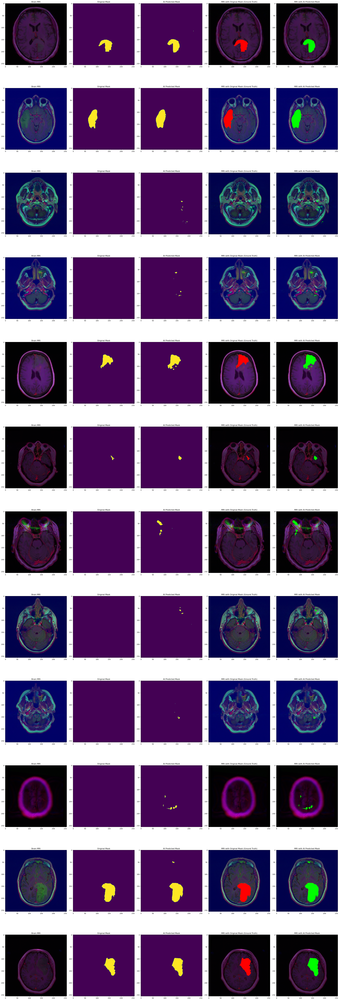

In [92]:
count = 0 
fig, axs = plt.subplots(12, 5, figsize=(30,90))
for i in range(len(df_pred)):
  if df_pred['has_mask'][i] == 1 and count < 12:
    # read the images and convert them to RGB format
    img = io.imread(df_pred.image_path[i])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    axs[count][0].title.set_text("Brain MRI")
    axs[count][0].imshow(img)

    # Obtain the mask for the image 
    mask = io.imread(df_pred.mask_path[i])
    axs[count][1].title.set_text("Original Mask")
    axs[count][1].imshow(mask)

    # Obtain the predicted mask for the image 
    predicted_mask = np.asarray(df_pred.predicted_mask[i])[0].squeeze().round()
    axs[count][2].title.set_text("AI Predicted Mask")
    axs[count][2].imshow(predicted_mask)
    
    # Apply the mask to the image 'mask==255'
    img[mask == 255] = (255, 0, 0)
    axs[count][3].title.set_text("MRI with Original Mask (Ground Truth)")
    axs[count][3].imshow(img)

    img_ = io.imread(df_pred.image_path[i])
    img_ = cv2.cvtColor(img_, cv2.COLOR_BGR2RGB)
    img_[predicted_mask == 1] = (0, 255, 0)
    axs[count][4].title.set_text("MRI with AI Predicted Mask")
    axs[count][4].imshow(img_)
    count += 1

fig.tight_layout()

1/1 [==============================] - 1s 838ms/step


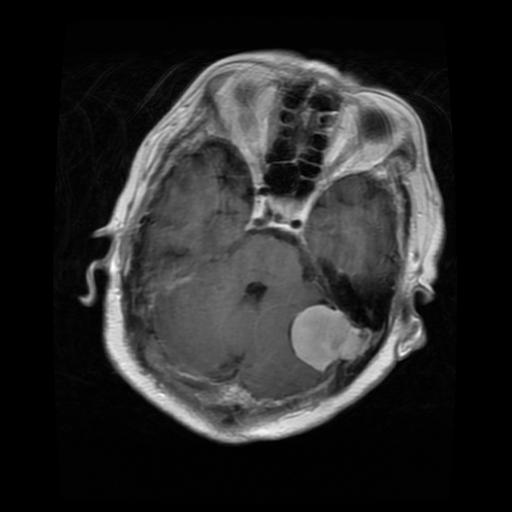

Prediction: [[0.71201783 0.2879822 ]]


In [105]:
import tkinter as tk
from tkinter import filedialog
from IPython.display import Image, display
from tensorflow.keras.preprocessing import image
import numpy as np

root = tk.Tk()
root.withdraw()  # Hide the main window

file_path = filedialog.askopenfilename()  # Open the file dialog

def display_and_predict(file_path):
    img = image.load_img(file_path, target_size=(256, 256))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0) / 255.0

    model = load_model('classifier-resnet-weights.hdf5')
    prediction = model.predict(img_array)
    
    # Show the image
    display(Image(filename=file_path))
    print("Prediction:", prediction)

if file_path:
    display_and_predict(file_path)


1/1 [==============================] - 1s 590ms/step


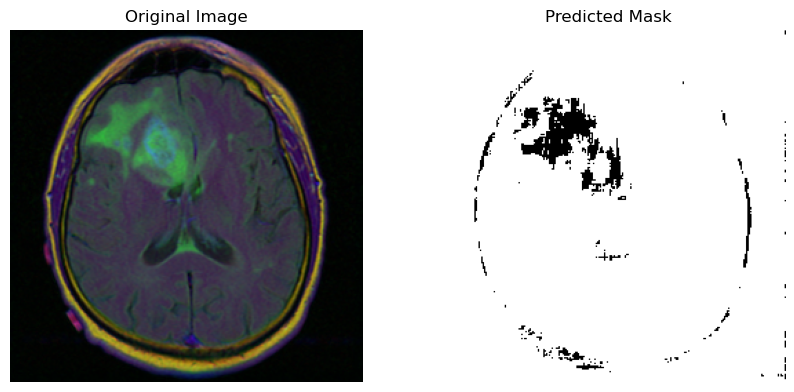

In [144]:
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import numpy as np
import matplotlib.pyplot as plt

# Load the segmentation model
model = load_model('workingResUNet-weights.hdf5', custom_objects=custom_objects)

# Load and preprocess your image
img_path ='/Users/chaithra/tensorflow-test/Brain_MRI/TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_14.tif'
img = load_img(img_path, target_size=(256, 256))  # Adjust size as per your model's requirement
img_array = img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) / 255.0  # Normalize if your model expects this

# Predict the mask
prediction = model.predict(img_array)
predicted_mask = prediction.squeeze()  # Remove batch dimension

# If your model outputs probabilities (sigmoid activation), threshold to create a binary mask
thresholded_mask = (predicted_mask > 0.00004).astype(int)

# Display the original image and the predicted mask
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.title('Original Image')
plt.imshow(img)
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title('Predicted Mask')
plt.imshow(thresholded_mask, cmap='gray')
plt.axis('off')
plt.show()


In [125]:
custom_objects = {
    'focal_tversky': focal_tversky,
    'dsc': dsc,
    'dice_loss': dice_loss,
    'bce_dice_loss': bce_dice_loss,
    'tp': tp,
    'tn': tn,
    'tversky': tversky,
    'tversky_loss': tversky_loss
}
loaded_model = load_model('workingResUNet-weights.hdf5', custom_objects=custom_objects)

In [124]:
from keras.losses import binary_crossentropy
import keras.backend as K
import tensorflow as tf 

epsilon = 1e-5
smooth = 1

def dsc(y_true, y_pred):
    smooth = 1.
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    score = (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)
    return score

def dice_loss(y_true, y_pred):
    loss = 1 - dsc(y_true, y_pred)
    return loss

def bce_dice_loss(y_true, y_pred):
    loss = binary_crossentropy(y_true, y_pred) + dice_loss(y_true, y_pred)
    return loss

def confusion(y_true, y_pred):
    smooth=1
    y_pred_pos = K.clip(y_pred, 0, 1)
    y_pred_neg = 1 - y_pred_pos
    y_pos = K.clip(y_true, 0, 1)
    y_neg = 1 - y_pos
    tp = K.sum(y_pos * y_pred_pos)
    fp = K.sum(y_neg * y_pred_pos)
    fn = K.sum(y_pos * y_pred_neg) 
    prec = (tp + smooth)/(tp+fp+smooth)
    recall = (tp+smooth)/(tp+fn+smooth)
    return prec, recall

def tp(y_true, y_pred):
    smooth = 1
    y_pred_pos = K.round(K.clip(y_pred, 0, 1))
    y_pos = K.round(K.clip(y_true, 0, 1))
    tp = (K.sum(y_pos * y_pred_pos) + smooth)/ (K.sum(y_pos) + smooth) 
    return tp 

def tn(y_true, y_pred):
    smooth = 1
    y_pred_pos = K.round(K.clip(y_pred, 0, 1))
    y_pred_neg = 1 - y_pred_pos
    y_pos = K.round(K.clip(y_true, 0, 1))
    y_neg = 1 - y_pos 
    tn = (K.sum(y_neg * y_pred_neg) + smooth) / (K.sum(y_neg) + smooth )
    return tn 

def tversky(y_true, y_pred):
    y_true_pos = K.flatten(y_true)
    y_pred_pos = K.flatten(y_pred)
    true_pos = K.sum(y_true_pos * y_pred_pos)
    false_neg = K.sum(y_true_pos * (1-y_pred_pos))
    false_pos = K.sum((1-y_true_pos)*y_pred_pos)
    alpha = 0.7
    return (true_pos + smooth)/(true_pos + alpha*false_neg + (1-alpha)*false_pos + smooth)

def tversky_loss(y_true, y_pred):
    return 1 - tversky(y_true,y_pred)

def focal_tversky(y_true,y_pred):
    pt_1 = tversky(y_true, y_pred)
    gamma = 0.75
    return K.pow((1-pt_1), gamma)

1/1 [==============================] - 0s 286ms/step


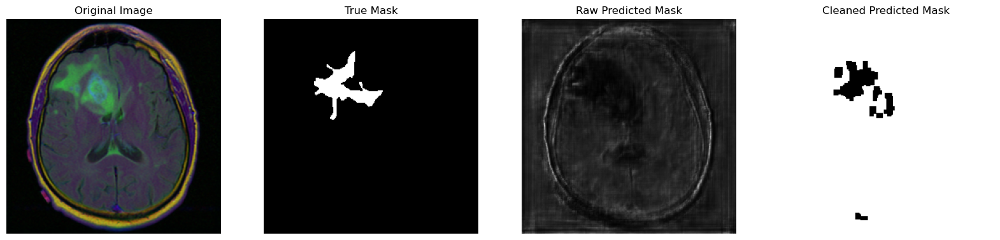

In [143]:
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import numpy as np
import matplotlib.pyplot as plt
from skimage import io
from skimage.morphology import opening, closing, square
import cv2

# Load the model with custom loss functions
model = load_model('workingResUNet-weights.hdf5', custom_objects=custom_objects)

def process_image_and_mask(image_path, mask_path=None):
    # Load and preprocess the image
    img = load_img(image_path, target_size=(256, 256))
    img_array = img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0) / 255.0  # Normalize the image data to 0-1

    # Predict the mask
    prediction = model.predict(img_array)
    predicted_mask = prediction.squeeze()  # Remove single-dimensional entries from the shape

    # Adjust the threshold based on observed prediction values
    thresholded_mask = (predicted_mask > 0.00004).astype(int)  # Adjust this threshold based on your model output

    # Apply morphological operations to clean up the mask
    cleaned_mask = closing(opening(thresholded_mask, square(3)), square(5))

    # Display the original image, the real mask (if provided), and the predicted mask
    fig, axs = plt.subplots(1, 4, figsize=(20, 5))
    axs[0].imshow(img, cmap='gray')
    axs[0].title.set_text('Original Image')
    axs[0].axis('off')

    if mask_path:
        true_mask = io.imread(mask_path)
        axs[1].imshow(true_mask, cmap='gray')
        axs[1].title.set_text('True Mask')
        axs[1].axis('off')

    axs[2].imshow(predicted_mask, cmap='gray')
    axs[2].title.set_text('Raw Predicted Mask')
    axs[2].axis('off')

    axs[3].imshow(cleaned_mask, cmap='gray')
    axs[3].title.set_text('Cleaned Predicted Mask')
    axs[3].axis('off')

    plt.show()

# Example usage
process_image_and_mask(
    '/Users/chaithra/tensorflow-test/Brain_MRI/TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_14.tif',
    '/Users/chaithra/tensorflow-test/Brain_MRI/TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_15_mask.tif'
)


In [134]:
from skimage.morphology import binary_opening, binary_closing, disk